# Guided Grad-CAM: Complete Implementation from Scratch

## Introduction

**Guided Grad-CAM** combines two powerful visualization techniques:
1. **Grad-CAM**: Provides class-discriminative localization (where the model is looking)
2. **Guided Backpropagation**: Provides fine-grained pixel-level details (what features are important)

**Mathematical Formula:**
$$\text{Guided Grad-CAM} = \text{Guided Backprop} \odot \text{Upsample}(\text{Grad-CAM})$$

Where $\odot$ represents element-wise multiplication.

**Key Benefits:**
- Combines coarse localization with fine-grained details
- More interpretable than either method alone
- Shows both WHERE and WHAT the model focuses on

---

## Notebook Structure
1. Setup and Imports
2. Load Model and Image
3. Get Model Predictions
4. Standard Grad-CAM Implementation
5. Guided Backpropagation Implementation
6. Guided Grad-CAM Implementation
7. Comprehensive Visualizations
8. Complete Reusable Class
9. Advanced Analysis

## 1. Setup and Imports

In [1]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import os

import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models, transforms

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Set random seed for reproducibility
torch.manual_seed(42)
np.random.seed(42)

Using device: cpu


## 2. Load Model and Image

We'll use a pre-trained VGG16 model and load a sample image for visualization.

In [22]:
# Load pre-trained VGG16 model
model = models.vgg16(pretrained=True)
model = model.to(device)
model.eval()

print("Model loaded successfully!")
print(f"Model architecture: VGG16")
print(f"Total parameters: {sum(p.numel() for p in model.parameters()):,}")

c:\Users\mahah\anaconda\envs\myenv\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\mahah\anaconda\envs\myenv\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Model loaded successfully!
Model architecture: VGG16
Total parameters: 138,357,544


In [2]:
# Download sample image (you can replace with your own)
import urllib.request


img_path = "Sushi.png"


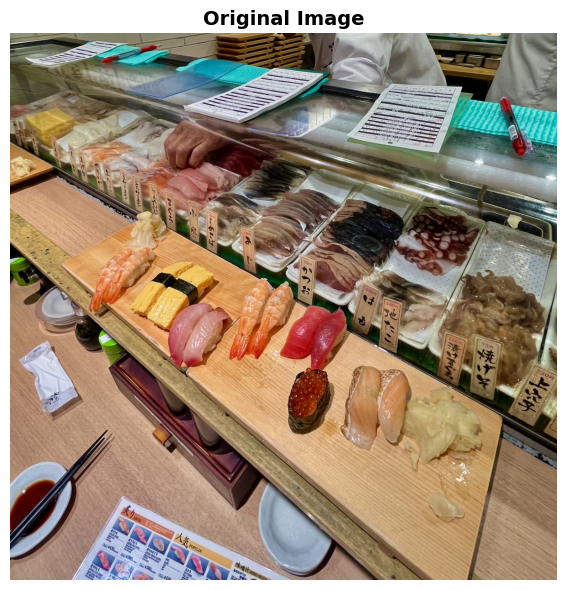

Image size: (2531, 2531)


In [3]:
# Load and display the image
img = Image.open(img_path).convert("RGB")

plt.figure(figsize=(8, 6))
plt.imshow(img)
plt.axis('off')
plt.title('Original Image', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print(f"Image size: {img.size}")

In [4]:
# Define preprocessing transform
preprocess = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Preprocess the image
img_tensor = preprocess(img).unsqueeze(0).to(device)
img_tensor.requires_grad = True

print(f"Preprocessed tensor shape: {img_tensor.shape}")
print(f"Tensor requires gradient: {img_tensor.requires_grad}")

Preprocessed tensor shape: torch.Size([1, 3, 224, 224])
Tensor requires gradient: True


## 3. Get Model Predictions

Let's see what the model predicts for this image.

In [ ]:
# Load ImageNet class names
import json

# Download ImageNet class names if not exists
labels_path = 'imagenet_classes.txt'

with open(labels_path) as f:
    imagenet_classes = [line.strip() for line in f.readlines()]

print(f"Loaded {len(imagenet_classes)} ImageNet classes")

Loaded 1000 ImageNet classes


In [24]:
# Get predictions
with torch.no_grad():
    output = model(img_tensor)
    probabilities = F.softmax(output, dim=1)

# Get top 5 predictions
top5_prob, top5_indices = torch.topk(probabilities, 5)

print("\nTop 5 Predictions:")
print("="*60)
for i, (prob, idx) in enumerate(zip(top5_prob[0], top5_indices[0])):
    print(f"{i+1}. {imagenet_classes[idx]:30s} - {prob.item()*100:.2f}%")

# Store the target class (top prediction)
target_class = top5_indices[0][0].item()
print(f"\nTarget class for visualization: {target_class} ({imagenet_classes[target_class]})")


Top 5 Predictions:
1. grocery store                  - 29.73%
2. confectionery                  - 16.05%
3. tobacco shop                   - 15.37%
4. bakery                         - 13.21%
5. hotdog                         - 7.94%

Target class for visualization: 582 (grocery store)


## 4. Standard Grad-CAM Implementation

First, we implement standard Grad-CAM to get the coarse localization map.

**Grad-CAM Formula:**
$$L_{\text{Grad-CAM}}^c = \text{ReLU}\left(\sum_k \alpha_k^c A^k\right)$$

Where:
- $\alpha_k^c = \frac{1}{Z}\sum_i\sum_j \frac{\partial y^c}{\partial A^k_{ij}}$ (importance weights)
- $A^k$ is the activation map from layer $k$
- $y^c$ is the score for class $c$

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
def set_inplace_false(model):
    """
    Recursively set inplace=False for all ReLU layers in the model.
    This is necessary to avoid conflicts with GradCAM hooks.
    """
    for module in model.modules():
        if isinstance(module, nn.ReLU):
            module.inplace = False


class GradCAM:
    """
    Grad-CAM implementation from scratch.
    
    Args:
        model: The neural network model
        target_layer: The layer to compute Grad-CAM for (typically last conv layer)
    """
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.activations = None
        self.gradients = None
        
        # IMPORTANT: Disable inplace operations in ReLU layers
        set_inplace_false(self.model)
        # Register hooks
        self.forward_hook = target_layer.register_forward_hook(self._forward_hook)
        self.backward_hook = target_layer.register_full_backward_hook(self._backward_hook)
    
    def _forward_hook(self, module, input, output):
        """Save activations during forward pass"""
        self.activations = output.detach()
    
    def _backward_hook(self, module, grad_input, grad_output):
        """Save gradients during backward pass"""
        self.gradients = grad_output[0].detach()
        # IMPORTANT: Return None to let gradients flow normally
        # If we return a tuple, it will override the gradient
        return None
    
    def generate_cam(self, input_tensor, target_class=None):
        """
        Generate GradCAM heatmap.
        
        Args:
            input_tensor: Input image tensor (1, C, H, W)
            target_class: Target class index (if None, use predicted class)
        
        Returns:
            cam: GradCAM heatmap (H, W)
            prediction: Predicted class index
        """
        # Set model to eval mode
        self.model.eval()
        
        # Enable gradient computation
        with torch.set_grad_enabled(True):
            # Make sure input requires gradients
            input_tensor = input_tensor.requires_grad_(True)
            
            # Forward pass
            output = self.model(input_tensor)
            
            # Get target class
            if target_class is None:
                target_class = output.argmax(dim=1).item()
            
            # Zero gradients
            self.model.zero_grad()
            
            # Backward pass - use the score for the target class
            target_score = output[0, target_class]
            target_score.backward()
            
            # Now we can safely detach and move to CPU/numpy
            activations = self.activations.detach().cpu().numpy()[0]  # (C, H, W)
            gradients = self.gradients.detach().cpu().numpy()[0]      # (C, H, W)
        
        # Global average pooling of gradients to get importance weights
        weights = np.mean(gradients, axis=(1, 2))  # (C,)
        
        # Weighted combination of activation maps
        cam = np.zeros(activations.shape[1:], dtype=np.float32)  # (H, W)
        for i, w in enumerate(weights):
            cam += w * activations[i]
        
        # Apply ReLU (only keep positive influences)
        cam = np.maximum(cam, 0)
        
        # Normalize to [0, 1]
        if cam.max() > 0:
            cam = (cam - cam.min()) / (cam.max() - cam.min())
        
        return cam, target_class
    def visualize(self, input_tensor, img_pil, target_class=None, save_path=None):
        """
        Generate and visualize GradCAM.
        
        Args:
            input_tensor: Input tensor
            img_pil: Original PIL image
            target_class: Target class (if None, use predicted)
            save_path: Path to save visualization (optional)
        """
        # Generate CAM
        cam, pred_class = self.generate_cam(input_tensor, target_class)
        
        # Resize CAM to image size
        cam_resized = cv2.resize(cam, img_pil.size)
        
        # Apply colormap
        heatmap = cv2.applyColorMap(np.uint8(255 * cam_resized), cv2.COLORMAP_JET)
        heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB) / 255.0
        
        # Overlay
        img_array = np.array(img_pil) / 255.0
        overlay = 0.6 * heatmap + 0.4 * img_array
        overlay = overlay / overlay.max()
        
        # Plot
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        
        axes[0].imshow(img_pil)
        axes[0].set_title("Original")
        axes[0].axis('off')
        
        axes[1].imshow(cam_resized, cmap='jet')
        axes[1].set_title("GradCAM Heatmap")
        axes[1].axis('off')
        
        axes[2].imshow(overlay)
        axes[2].set_title("Overlay")
        axes[2].axis('off')
        
        # Assuming you have imagenet_classes defined
        try:
            plt.suptitle(f"Class: {imagenet_classes[pred_class]}", 
                        fontsize=14, fontweight='bold')
        except:
            plt.suptitle(f"Class Index: {pred_class}", 
                        fontsize=14, fontweight='bold')
        
        plt.tight_layout()
        
        if save_path:
            plt.savefig(save_path, dpi=150, bbox_inches='tight')
            print(f"✓ Saved to {save_path}")
        
        plt.show()
        
        return cam_resized, pred_class
    def remove_hooks(self):
        """Remove registered hooks"""
        self.forward_hook.remove()
        self.backward_hook.remove()

print("GradCAM class defined successf")

GradCAM class defined successf


Model loaded successfully!
Model architecture: VGG16
Total parameters: 138,357,544

Top 5 Predictions:
1. grocery store                  - 29.73%
2. confectionery                  - 16.05%
3. tobacco shop                   - 15.37%
4. bakery                         - 13.21%
5. hotdog                         - 7.94%

Target class for visualization: 582 (grocery store)

Grad-CAM heatmap shape: (14, 14)
Grad-CAM min: 0.0000, max: 1.0000
✓ Saved to gradcam_result.png


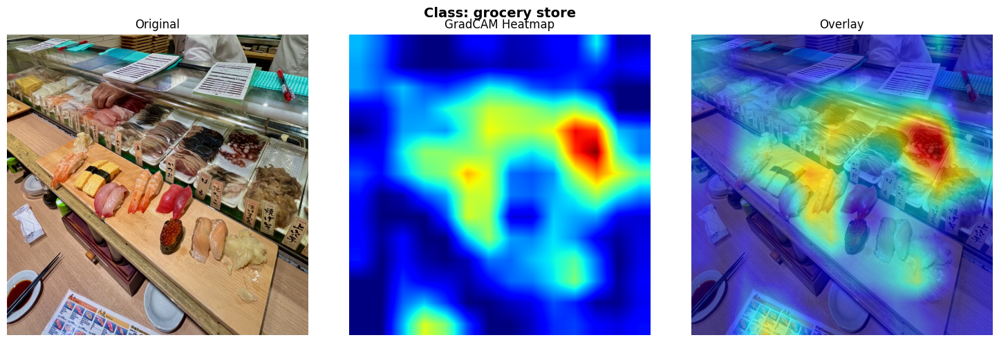

(array([[0.3083176 , 0.3083176 , 0.3083176 , ..., 0.04941172, 0.04941172,
         0.04941172],
        [0.3083176 , 0.3083176 , 0.3083176 , ..., 0.04941172, 0.04941172,
         0.04941172],
        [0.3083176 , 0.3083176 , 0.3083176 , ..., 0.04941172, 0.04941172,
         0.04941172],
        ...,
        [0.        , 0.        , 0.        , ..., 0.13303551, 0.13303551,
         0.13303551],
        [0.        , 0.        , 0.        , ..., 0.13303551, 0.13303551,
         0.13303551],
        [0.        , 0.        , 0.        , ..., 0.13303551, 0.13303551,
         0.13303551]], dtype=float32),
 582)

In [9]:
# Load pre-trained VGG16 model
model = models.vgg16(pretrained=True)
model = model.to(device)
model.eval()

print("Model loaded successfully!")
print(f"Model architecture: VGG16")
print(f"Total parameters: {sum(p.numel() for p in model.parameters()):,}")
print("="*60)

# Get predictions
with torch.no_grad():
    output = model(img_tensor)
    probabilities = F.softmax(output, dim=1)

# Get top 5 predictions
top5_prob, top5_indices = torch.topk(probabilities, 5)

print("\nTop 5 Predictions:")
for i, (prob, idx) in enumerate(zip(top5_prob[0], top5_indices[0])):
    print(f"{i+1}. {imagenet_classes[idx]:30s} - {prob.item()*100:.2f}%")

# Store the target class (top prediction)
target_class = top5_indices[0][0].item()
print(f"\nTarget class for visualization: {target_class} ({imagenet_classes[target_class]})")

# Apply Grad-CAM
target_layer = model.features[29]  # Last convolutional layer in VGG16
grad_cam = GradCAM(model, target_layer)

# Generate CAM
cam, pred = grad_cam.generate_cam(img_tensor, target_class)

print(f"\nGrad-CAM heatmap shape: {cam.shape}")
print(f"Grad-CAM min: {cam.min():.4f}, max: {cam.max():.4f}")

# Visualize
grad_cam.visualize(img_tensor, img, target_class=target_class, save_path='gradcam_result.png')

## 5. Guided Backpropagation Implementation

Guided Backpropagation modifies the backward pass to only propagate positive gradients through ReLU layers.

**Key Idea:**
- Standard backprop: passes all gradients through ReLU
- Deconvolution: passes only positive gradients (where forward activation > 0)
- **Guided backprop**: passes only positive gradients where BOTH forward activation AND backward gradient are positive

In [10]:
class GuidedBackprop:
    """
    Guided Backpropagation implementation from scratch.
    
    Modifies ReLU backward pass to only propagate positive gradients.
    """
    def __init__(self, model):
        self.model = model
        self.hooks = []
        self.model.eval()
        
        # Register hooks for all ReLU layers
        self._register_hooks()
    
    def _guided_relu_hook(self, module, grad_input, grad_output):
        """
        Hook function to modify ReLU backward pass.
        Only propagate positive gradients.
        """
        grad = grad_input[0]
        if grad is not None:
            # Clamp negative gradients to zero
            modified_grad = torch.clamp(grad, min=0.0)
            return (modified_grad,)
        return grad_input
    
    def _register_hooks(self):
        """
        Register backward hooks for all ReLU layers.
        """
        for module in self.model.modules():
            if isinstance(module, nn.ReLU):
                hook = module.register_full_backward_hook(self._guided_relu_hook)
                self.hooks.append(hook)
        
        print(f"Registered {len(self.hooks)} ReLU hooks")
    
    def generate_gradients(self, input_tensor, target_class):
        """
        Generate guided backpropagation gradients.
        
        Args:
            input_tensor: Input image tensor (requires_grad=True)
            target_class: Target class index
            
        Returns:
            gradients: Guided backprop gradients (C x H x W)
        """
        # Ensure input requires gradient
        if not input_tensor.requires_grad:
            input_tensor.requires_grad = True
        
        # Forward pass
        output = self.model(input_tensor)
        
        # Zero gradients
        self.model.zero_grad()
        if input_tensor.grad is not None:
            input_tensor.grad.zero_()
        
        # Create one-hot target
        one_hot = torch.zeros_like(output)
        one_hot[0][target_class] = 1.0
        
        # Backward pass (guided by hooks)
        output.backward(gradient=one_hot, retain_graph=True)
        
        # Get gradients
        gradients = input_tensor.grad.detach().cpu()[0]
        
        return gradients
    
    def remove_hooks(self):
        """Remove all registered hooks"""
        for hook in self.hooks:
            hook.remove()
        self.hooks = []

print("GuidedBackprop class defined successfully!")

GuidedBackprop class defined successfully!


In [11]:
# Apply Guided Backpropagation
guided_bp = GuidedBackprop(model)

# Generate guided gradients
guided_grads = guided_bp.generate_gradients(img_tensor, target_class)

print(f"Guided gradients shape: {guided_grads.shape}")
print(f"Guided gradients min: {guided_grads.min():.4f}, max: {guided_grads.max():.4f}")

Registered 15 ReLU hooks
Guided gradients shape: torch.Size([3, 224, 224])
Guided gradients min: -1.3598, max: 0.6486


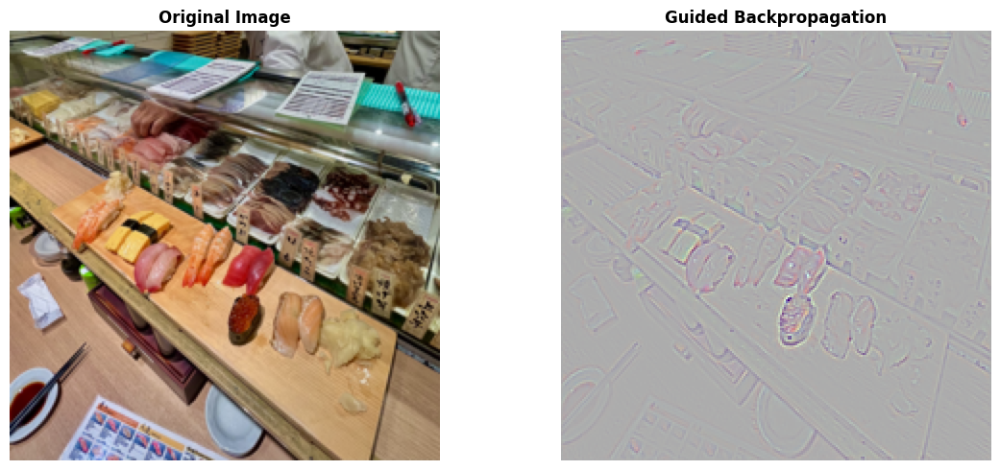

In [12]:
# Process guided gradients for visualization
def process_guided_grads(grads):
    """
    Process guided backprop gradients for visualization.
    
    Args:
        grads: Gradient tensor (C x H x W)
        
    Returns:
        Processed gradients as numpy array (H x W x C) in [0, 1]
    """
    # Convert to numpy and transpose to (H, W, C)
    grads_np = grads.numpy().transpose(1, 2, 0)
    
    # Normalize to [0, 1]
    grads_np = grads_np - grads_np.min()
    grads_np = grads_np / (grads_np.max() + 1e-8)
    
    return grads_np

guided_grads_viz = process_guided_grads(guided_grads)

# Visualize
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
if 'img_resized' not in locals():
    img_resized = img.resize((224, 224))
axes[0].imshow(img_resized)
axes[0].set_title('Original Image', fontsize=12, fontweight='bold')
axes[0].axis('off')

axes[1].imshow(guided_grads_viz, cmap='gray')
axes[1].set_title('Guided Backpropagation', fontsize=12, fontweight='bold')
axes[1].axis('off')

plt.tight_layout()
plt.show()

## 6. Guided Grad-CAM Implementation

Now we combine Grad-CAM and Guided Backpropagation to create Guided Grad-CAM.

**Implementation:**
1. Upsample Grad-CAM to input size
2. Apply element-wise multiplication with Guided Backprop
3. Normalize the result

This gives us a visualization that has:
- The localization of Grad-CAM
- The fine-grained detail of Guided Backprop

In [23]:
from scipy.ndimage import zoom

class GuidedGradCAM:
    """
    Guided Grad-CAM: Combines Grad-CAM with Guided Backpropagation.
    
    Args:
        model: The neural network model
        target_layer: The layer to compute Grad-CAM for
    """
    def __init__(self, model, target_layer):
        # IMPORTANT: Create GuidedBackprop FIRST to modify ReLU layers
        # before GradCAM registers its hooks
        self.guided_bp = GuidedBackprop(model)
        self.grad_cam = GradCAM(model, target_layer)
    
    def generate_guided_gradcam(self, input_tensor, target_class, upsample_size=(224, 224)):
        """
        Generate Guided Grad-CAM visualization.
        
        Args:
            input_tensor: Input image tensor
            target_class: Target class index
            upsample_size: Size to upsample CAM to (H, W)
            
        Returns:
            guided_gradcam: Combined visualization (H x W x C)
        """
        # Generate Grad-CAM
        cam,_ = self.grad_cam.generate_cam(input_tensor, target_class)
        #cam= cam.squeeze().num
        # Upsample CAM to input size
        cam_upsampled = zoom(cam, 
                           (upsample_size[0]/cam.shape[0], 
                            upsample_size[1]/cam.shape[1]), 
                           order=1)
        
        # Generate Guided Backprop
        guided_grads = self.guided_bp.generate_gradients(input_tensor, target_class)
        guided_grads_np = guided_grads.numpy().transpose(1, 2, 0)
        
        # Element-wise multiplication
        # Expand CAM to 3 channels
        cam_expanded = np.expand_dims(cam_upsampled, axis=2)
        cam_expanded = np.repeat(cam_expanded, 3, axis=2)
        
        # Multiply
        guided_gradcam = guided_grads_np * cam_expanded
        
        # Normalize to [0, 1]
        guided_gradcam = guided_gradcam - guided_gradcam.min()
        guided_gradcam = guided_gradcam / (guided_gradcam.max() + 1e-8)
        
        return guided_gradcam,cam_upsampled
    
    def remove_hooks(self):
        """Remove all hooks"""
        self.grad_cam.remove_hooks()
        self.guided_bp.remove_hooks()

print("GuidedGradCAM class defined su")

GuidedGradCAM class defined su


In [24]:


# Import zoom if not already imported
from scipy.ndimage import zoom

# Define img_resized if not defined
img_resized = img.resize((224, 224))

# Remove old hooks first to avoid conflicts
if 'grad_cam' in locals():
    grad_cam.remove_hooks()
if 'guided_bp' in locals():
    guided_bp.remove_hooks()

# Apply Guided Grad-CAM with fresh instances
guided_gradcam = GuidedGradCAM(model, target_layer)

# DEBUG: Test what generate_cam returns
print("DEBUG: Testing GradCAM.generate_cam()...")
test_result = guided_gradcam.grad_cam.generate_cam(img_tensor, target_class)
print(f"Type returned: {type(test_result)}")
print(f"Value: {test_result}")


# Generate visualization
ggcam_viz, cam_upsampled = guided_gradcam.generate_guided_gradcam(img_tensor, target_class)

print(f"Guided Grad-CAM shape: {ggcam_viz.shape}")
print(f"Guided Grad-CAM min: {ggcam_viz.min():.4f}, max: {ggcam_viz.max():.4f}")

Registered 15 ReLU hooks
DEBUG: Testing GradCAM.generate_cam()...
Type returned: <class 'tuple'>
Value: (array([[0.34157664, 0.28900635, 0.21145494, 0.14400448, 0.11041161,
        0.20086092, 0.19620568, 0.05736403, 0.        , 0.        ,
        0.02899482, 0.15432349, 0.        , 0.        ],
       [0.3403423 , 0.27802464, 0.13640912, 0.        , 0.        ,
        0.07576352, 0.11771188, 0.12773961, 0.        , 0.        ,
        0.00741143, 0.21704124, 0.09539877, 0.        ],
       [0.28027868, 0.3188119 , 0.44329453, 0.37218216, 0.2788609 ,
        0.29024032, 0.36215085, 0.5034935 , 0.42500347, 0.34756726,
        0.2183891 , 0.        , 0.        , 0.        ],
       [0.09759587, 0.17725518, 0.35533556, 0.34907028, 0.3585745 ,
        0.4173951 , 0.572554  , 0.60206115, 0.6072451 , 0.52240056,
        0.49935356, 0.3607493 , 0.00881495, 0.        ],
       [0.        , 0.1675376 , 0.38139713, 0.3198229 , 0.2127524 ,
        0.3282869 , 0.5481525 , 0.56865185, 0.5762582 ,

## 7. Comprehensive Visualizations

Let's compare all three methods side by side.

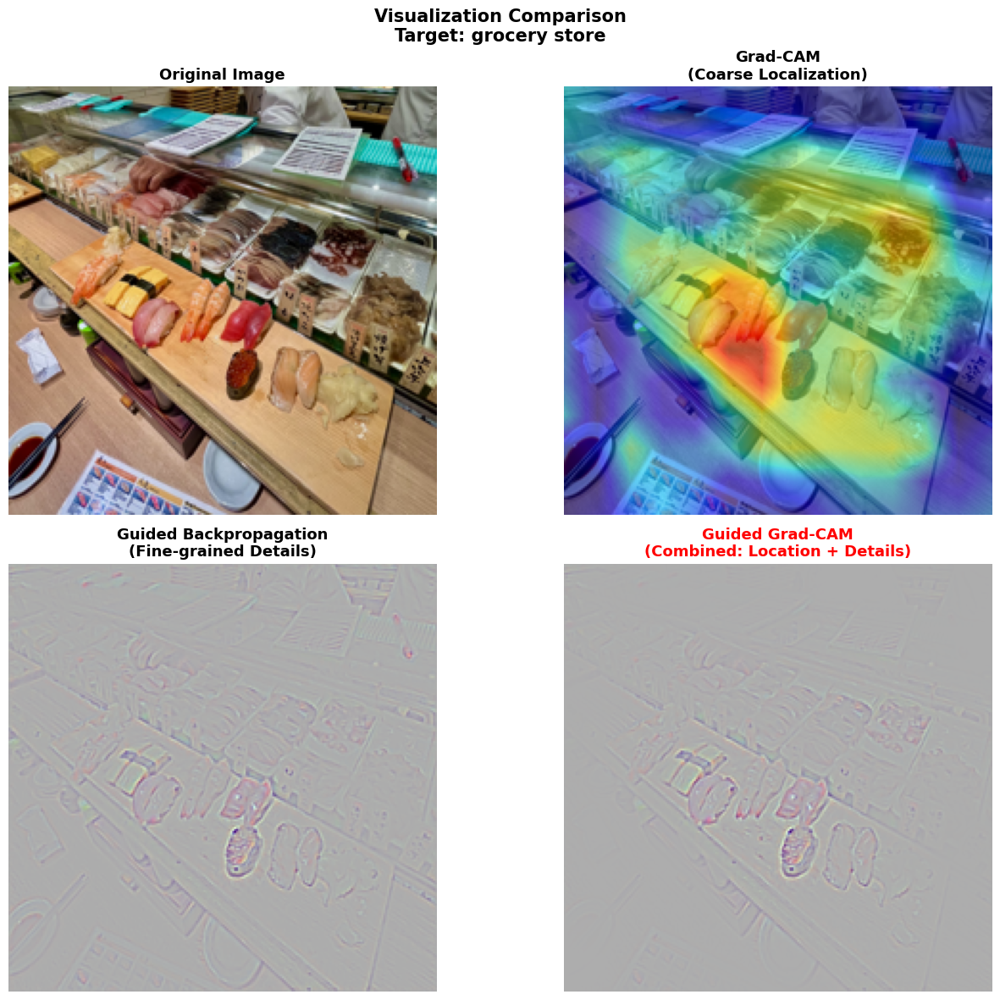

In [25]:
# Side-by-side comparison
fig, axes = plt.subplots(2, 2, figsize=(14, 12))

# Original image
axes[0, 0].imshow(img_resized)
axes[0, 0].set_title('Original Image', fontsize=13, fontweight='bold')
axes[0, 0].axis('off')

# Grad-CAM
axes[0, 1].imshow(img_resized)
axes[0, 1].imshow(cam_upsampled, cmap='jet', alpha=0.5)
axes[0, 1].set_title('Grad-CAM\n(Coarse Localization)', fontsize=13, fontweight='bold')
axes[0, 1].axis('off')

# Guided Backpropagation
axes[1, 0].imshow(guided_grads_viz, cmap='gray')
axes[1, 0].set_title('Guided Backpropagation\n(Fine-grained Details)', fontsize=13, fontweight='bold')
axes[1, 0].axis('off')

# Guided Grad-CAM
axes[1, 1].imshow(ggcam_viz)
axes[1, 1].set_title('Guided Grad-CAM\n(Combined: Location + Details)', fontsize=13, fontweight='bold', color='red')
axes[1, 1].axis('off')

plt.suptitle(f'Visualization Comparison\nTarget: {imagenet_classes[target_class]}', 
             fontsize=15, fontweight='bold', y=0.98)
plt.tight_layout()
plt.show()

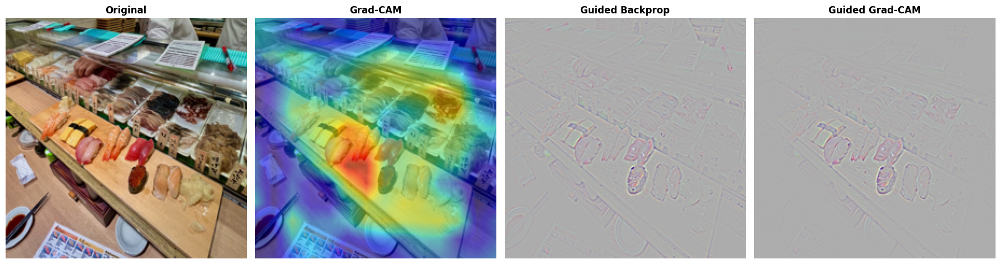

In [26]:
# Alternative visualization: horizontal layout
fig, axes = plt.subplots(1, 4, figsize=(18, 5))

axes[0].imshow(img_resized)
axes[0].set_title('Original', fontsize=12, fontweight='bold')
axes[0].axis('off')

axes[1].imshow(img_resized)
axes[1].imshow(cam_upsampled, cmap='jet', alpha=0.5)
axes[1].set_title('Grad-CAM', fontsize=12, fontweight='bold')
axes[1].axis('off')

axes[2].imshow(guided_grads_viz, cmap='gray')
axes[2].set_title('Guided Backprop', fontsize=12, fontweight='bold')
axes[2].axis('off')

axes[3].imshow(ggcam_viz)
axes[3].set_title('Guided Grad-CAM', fontsize=12, fontweight='bold')
axes[3].axis('off')

plt.tight_layout()
plt.show()

## 8. Complete Reusable Class

Here's a complete, production-ready class that encapsulates everything.

In [29]:
class CompleteGuidedGradCAM:
    """
    Production-ready Guided Grad-CAM implementation.
    
    Provides easy-to-use interface for generating all three visualizations:
    - Grad-CAM
    - Guided Backpropagation
    - Guided Grad-CAM
    
    Args:
        model: Neural network model
        target_layer: Layer to extract activations from
        device: Device to run on ('cuda' or 'cpu')
    """
    
    def __init__(self, model, target_layer, device='cpu'):
        self.model = model.to(device)
        self.device = device
        self.target_layer = target_layer
        
        # Initialize components
        self.grad_cam = GradCAM(model, target_layer)
        self.guided_bp = GuidedBackprop(model)
    
    def __call__(self, input_tensor, target_class=None, return_all=True):
        """
        Generate visualizations.
        
        Args:
            input_tensor: Input image tensor (1 x C x H x W)
            target_class: Target class (if None, uses top prediction)
            return_all: If True, returns dict with all visualizations
            
        Returns:
            If return_all=True: dict with 'gradcam', 'guided_bp', 'guided_gradcam'
            If return_all=False: only guided_gradcam
        """
        # Ensure tensor is on correct device
        input_tensor = input_tensor.to(self.device)
        if not input_tensor.requires_grad:
            input_tensor.requires_grad = True
        
        # Get target class if not provided
        if target_class is None:
            with torch.no_grad():
                output = self.model(input_tensor)
                target_class = output.argmax(dim=1).item()
        
        # Get input size
        _, _, h, w = input_tensor.shape
        
        # Generate Grad-CAM
        cam,_ = self.grad_cam.generate_cam(input_tensor, target_class)
        cam_upsampled = zoom(cam, (h/cam.shape[0], w/cam.shape[1]), order=1)
        
        # Generate Guided Backprop
        guided_grads = self.guided_bp.generate_gradients(input_tensor, target_class)
        guided_grads_np = guided_grads.numpy().transpose(1, 2, 0)
        
        # Normalize guided grads
        guided_grads_norm = guided_grads_np - guided_grads_np.min()
        guided_grads_norm = guided_grads_norm / (guided_grads_norm.max() + 1e-8)
        
        # Generate Guided Grad-CAM
        cam_expanded = np.expand_dims(cam_upsampled, axis=2)
        cam_expanded = np.repeat(cam_expanded, 3, axis=2)
        guided_gradcam = guided_grads_np * cam_expanded
        
        # Normalize
        guided_gradcam = guided_gradcam - guided_gradcam.min()
        guided_gradcam = guided_gradcam / (guided_gradcam.max() + 1e-8)
        
        if return_all:
            return {
                'gradcam': cam_upsampled,
                'guided_bp': guided_grads_norm,
                'guided_gradcam': guided_gradcam,
                'target_class': target_class
            }
        else:
            return guided_gradcam
    
    def visualize(self, input_tensor, target_class=None, original_img=None):
        """
        Generate and display all visualizations.
        
        Args:
            input_tensor: Input image tensor
            target_class: Target class (if None, uses top prediction)
            original_img: Original PIL image for display
        """
        results = self(input_tensor, target_class, return_all=True)
        
        # Create visualization
        fig, axes = plt.subplots(1, 4, figsize=(18, 5))
        
        # Original image
        if original_img is not None:
            axes[0].imshow(original_img)
        else:
            # Denormalize tensor for display
            mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
            std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
            img_denorm = input_tensor[0].cpu() * std + mean
            img_denorm = img_denorm.permute(1, 2, 0).numpy()
            img_denorm = np.clip(img_denorm, 0, 1)
            axes[0].imshow(img_denorm)
        axes[0].set_title('Original', fontsize=12, fontweight='bold')
        axes[0].axis('off')
        
        # Grad-CAM
        if original_img is not None:
            axes[1].imshow(original_img)
        axes[1].imshow(results['gradcam'], cmap='jet', alpha=0.5)
        axes[1].set_title('Grad-CAM', fontsize=12, fontweight='bold')
        axes[1].axis('off')
        
        # Guided Backprop
        axes[2].imshow(results['guided_bp'], cmap='gray')
        axes[2].set_title('Guided Backprop', fontsize=12, fontweight='bold')
        axes[2].axis('off')
        
        # Guided Grad-CAM
        axes[3].imshow(results['guided_gradcam'])
        axes[3].set_title('Guided Grad-CAM', fontsize=12, fontweight='bold')
        axes[3].axis('off')
        
        plt.suptitle(f'Target Class: {results["target_class"]}', 
                    fontsize=14, fontweight='bold')
        plt.tight_layout()
        plt.show()
    
    def cleanup(self):
        """Remove all hooks"""
        self.grad_cam.remove_hooks()
        self.guided_bp.remove_hooks()

print("CompleteGuidedGradCAM class defined successfully!")

CompleteGuidedGradCAM class defined successfully!


Registered 15 ReLU hooks


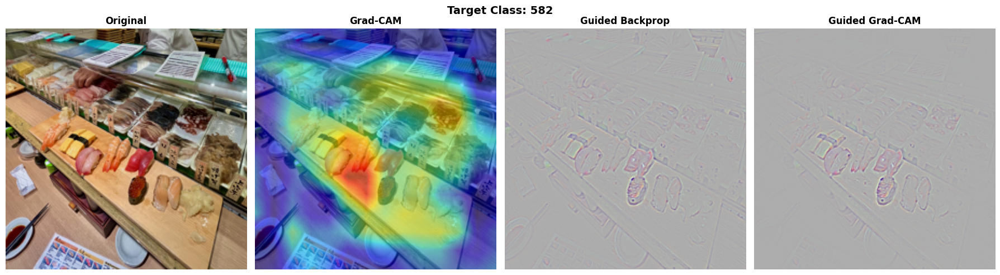

In [30]:
# Example usage of the complete class
visualizer = CompleteGuidedGradCAM(model, target_layer, device=device)

# Visualize with one line
visualizer.visualize(img_tensor, target_class=target_class, original_img=img_resized)

In [ ]:
# Get individual results
results = visualizer(img_tensor, target_class=target_class)

print("Available results:")
for key in results.keys():
    if isinstance(results[key], np.ndarray):
        print(f"  {key}: {results[key].shape}")
    else:
        print(f"  {key}: {results[key]}")

## 9. Advanced Analysis

Let's explore some advanced visualizations and analysis.

In [31]:
# Analyze multiple classes
top_k = 3
with torch.no_grad():
    output = model(img_tensor)
    top_probs, top_indices = torch.topk(F.softmax(output, dim=1), top_k)

print(f"Analyzing top {top_k} predictions:")
for i, (prob, idx) in enumerate(zip(top_probs[0], top_indices[0])):
    print(f"{i+1}. {imagenet_classes[idx]} ({prob.item()*100:.2f}%)")

Analyzing top 3 predictions:
1. grocery store (29.73%)
2. confectionery (16.05%)
3. tobacco shop (15.37%)


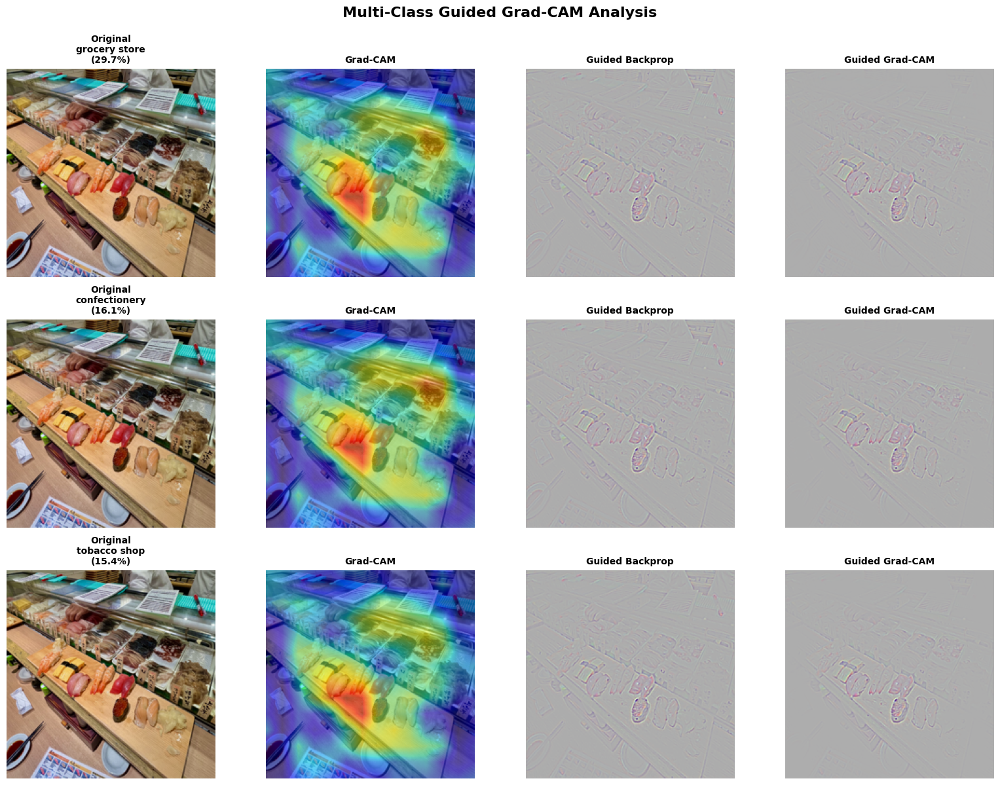

In [32]:
# Visualize Guided Grad-CAM for top-3 predictions
fig, axes = plt.subplots(top_k, 4, figsize=(16, 4*top_k))

for i, class_idx in enumerate(top_indices[0]):
    class_idx = class_idx.item()
    
    # Generate visualizations for this class
    results = visualizer(img_tensor, target_class=class_idx)
    
    # Original
    axes[i, 0].imshow(img_resized)
    axes[i, 0].set_title(f'Original\n{imagenet_classes[class_idx]}\n({top_probs[0][i].item()*100:.1f}%)', 
                        fontsize=10, fontweight='bold')
    axes[i, 0].axis('off')
    
    # Grad-CAM
    axes[i, 1].imshow(img_resized)
    axes[i, 1].imshow(results['gradcam'], cmap='jet', alpha=0.5)
    axes[i, 1].set_title('Grad-CAM', fontsize=10, fontweight='bold')
    axes[i, 1].axis('off')
    
    # Guided Backprop
    axes[i, 2].imshow(results['guided_bp'], cmap='gray')
    axes[i, 2].set_title('Guided Backprop', fontsize=10, fontweight='bold')
    axes[i, 2].axis('off')
    
    # Guided Grad-CAM
    axes[i, 3].imshow(results['guided_gradcam'])
    axes[i, 3].set_title('Guided Grad-CAM', fontsize=10, fontweight='bold')
    axes[i, 3].axis('off')

plt.suptitle('Multi-Class Guided Grad-CAM Analysis', fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout()
plt.show()

In [33]:
# Statistical analysis of attributions
results = visualizer(img_tensor, target_class=target_class)

print("Attribution Statistics:")
print("="*50)

for method in ['gradcam', 'guided_bp', 'guided_gradcam']:
    attr = results[method]
    
    print(f"\n{method.upper()}:")
    print(f"  Shape: {attr.shape}")
    print(f"  Min: {attr.min():.4f}")
    print(f"  Max: {attr.max():.4f}")
    print(f"  Mean: {attr.mean():.4f}")
    print(f"  Std: {attr.std():.4f}")
    print(f"  Non-zero pixels: {(attr > 0.1).sum()} ({(attr > 0.1).sum() / attr.size * 100:.2f}%)")

Attribution Statistics:

GRADCAM:
  Shape: (224, 224)
  Min: 0.0000
  Max: 0.9963
  Mean: 0.3256
  Std: 0.2022
  Non-zero pixels: 42673 (85.05%)

GUIDED_BP:
  Shape: (224, 224, 3)
  Min: 0.0000
  Max: 1.0000
  Mean: 0.6766
  Std: 0.0212
  Non-zero pixels: 150527 (100.00%)

GUIDED_GRADCAM:
  Shape: (224, 224, 3)
  Min: 0.0000
  Max: 1.0000
  Mean: 0.6784
  Std: 0.0192
  Non-zero pixels: 150527 (100.00%)


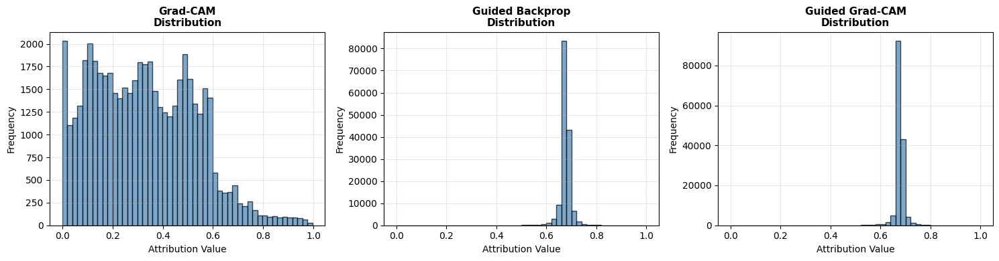

In [34]:
# Histogram comparison
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

methods = ['gradcam', 'guided_bp', 'guided_gradcam']
titles = ['Grad-CAM', 'Guided Backprop', 'Guided Grad-CAM']

for i, (method, title) in enumerate(zip(methods, titles)):
    attr = results[method].flatten()
    axes[i].hist(attr, bins=50, color='steelblue', alpha=0.7, edgecolor='black')
    axes[i].set_title(f'{title}\nDistribution', fontsize=11, fontweight='bold')
    axes[i].set_xlabel('Attribution Value', fontsize=10)
    axes[i].set_ylabel('Frequency', fontsize=10)
    axes[i].grid(alpha=0.3)

plt.tight_layout()
plt.show()

In [35]:
# Clean up hooks
visualizer.cleanup()
guided_gradcam.remove_hooks()
grad_cam.remove_hooks()
guided_bp.remove_hooks()

print("All hooks removed successfully!")

All hooks removed successfully!


## Summary and Key Takeaways

### What We Implemented:
1. **Grad-CAM**: Coarse localization showing WHERE the model looks
2. **Guided Backpropagation**: Fine-grained details showing WHAT features matter
3. **Guided Grad-CAM**: Combines both for superior visualization

### Key Differences:

| Method | Strengths | Weaknesses |
|--------|-----------|------------|
| Grad-CAM | Class-discriminative, localization | Low resolution, coarse |
| Guided Backprop | High resolution, fine details | Not class-discriminative |
| Guided Grad-CAM | Best of both worlds | Slightly more complex |

### When to Use:
- **Grad-CAM**: Quick localization, multi-layer analysis
- **Guided Backprop**: Understanding fine-grained features
- **Guided Grad-CAM**: Best overall visualization, paper-ready figures

### Mathematical Summary:
$$\text{Grad-CAM}: L^c = \text{ReLU}\left(\sum_k \alpha_k^c A^k\right)$$

$$\text{Guided Backprop}: \frac{\partial y^c}{\partial x} \text{ with positive gradients only}$$

$$\text{Guided Grad-CAM} = \text{Guided Backprop} \odot \text{Upsample}(\text{Grad-CAM})$$

### References:
1. Grad-CAM: [Selvaraju et al., 2017](https://arxiv.org/abs/1610.02391)
2. Guided Backprop: [Springenberg et al., 2015](https://arxiv.org/abs/1412.6806)